# Keypoint Detection and Matching


## 1. Basic image processing in Python



In [ ]:
import cv2 # OpenCV
import numpy as np
import matplotlib.pyplot as plt

# To see the images in a notebook:
%matplotlib inline

## Downloading an image


In [ ]:
# On Colab, for downloading an image, first do:
!wget "http://imagine.enpc.fr/~lepetitv/triva/mini_graffiti1.png"
!ls

# With or without Colab, then:
graffiti = plt.imread('mini_graffiti1.png')

--2024-03-26 09:41:24--  http://imagine.enpc.fr/~lepetitv/triva/mini_graffiti1.png
Resolving imagine.enpc.fr (imagine.enpc.fr)... 195.221.193.65
Connecting to imagine.enpc.fr (imagine.enpc.fr)|195.221.193.65|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 75121 (73K) [image/png]
Saving to: ‘mini_graffiti1.png.1’

mini_graffiti1.png. 100%[===================>]  73.36K   459KB/s    in 0.2s    

2024-03-26 09:41:25 (459 KB/s) - ‘mini_graffiti1.png.1’ saved [75121/75121]

asterix1.png	    mini_graffiti1.png.1  vangogh1.png	vangogh4.png  vangogh7.png
asterix2.png	    sample_data		  vangogh2.png	vangogh5.png
mini_graffiti1.png  vangogh0.png	  vangogh3.png	vangogh6.png


## Visualizing an image

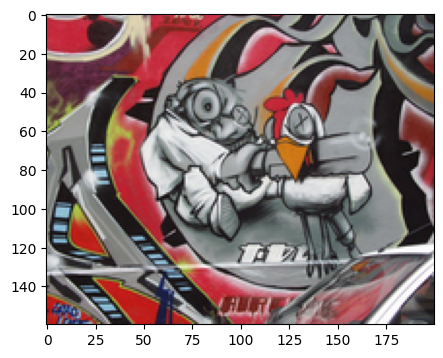

In [ ]:
figsize = 5
plt.figure(figsize=(figsize,figsize))

# Actually show the image
plt.imshow(graffiti)

In [ ]:
print("Size of the image (height, width, channels):", graffiti.shape)
print("Type of the values:", graffiti.dtype)
print("Minimum and maximum values:", graffiti.min(), "to", graffiti.max())

Size of the image (height, width, channels): (160, 200, 3)
Type of the values: float32
Minimum and maximum values: 0.0 to 1.0


## Converting the image to grayscale

I convert the graffiti image to grayscale using the formula L=0.2989 R + 0.5870 G + 0.1140 * B,  where R, G and B are the three color channels of the color image and L is the luminance (i.e. the grayscale image).

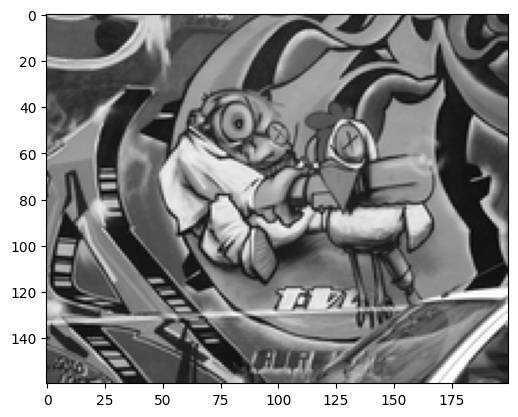

In [ ]:
R = graffiti[:, :, 0]
G = graffiti[:, :, 1]
B = graffiti[:, :, 2]

graffiti = 0.2989 * R + 0.5870 * G + 0.1140 * B

# Visualize the result
plt.imshow(graffiti, cmap='gray')

## Adding Gaussian noise

I create a new image by adding Gaussian noise of standard deviation 0.1 to the graffiti image and visualize the result.

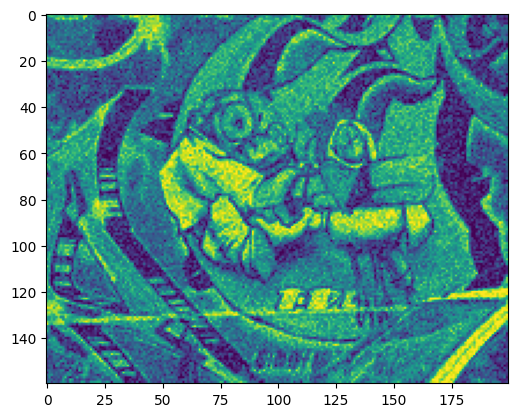

In [ ]:
noise = np.random.normal(0, 0.1, graffiti.shape)

# Add the noise to the image
noisy_graffiti = graffiti + noise

# Clip the values to be within the valid range
noisy_graffiti_clipped = np.clip(noisy_graffiti, 0, 1)

# Visualize the result
plt.imshow(noisy_graffiti_clipped)

## Convolution

I blur the noisy image with a Gaussian kernel of standard deviation 1.0 and visualize the result.

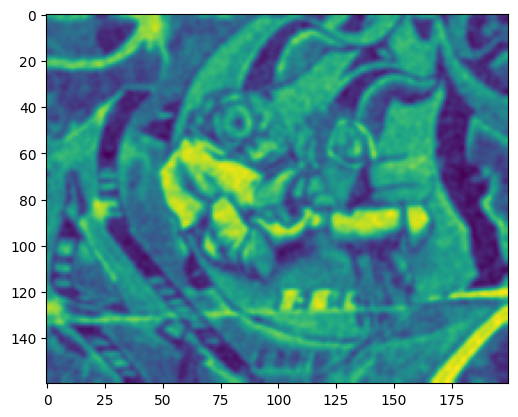

In [ ]:
noisy_graffiti_clipped_255 = (noisy_graffiti_clipped * 255).astype(np.uint8)

# Apply Gaussian blur
kernel_size = (7, 7) # Kernel size
sigma = 1.0 # Standard deviation
blurred_image = cv2.GaussianBlur(noisy_graffiti_clipped_255, kernel_size, sigma)

# Convert back to float32
blurred_image_float = blurred_image.astype(np.float32) / 255

# Visualize the result
plt.imshow(blurred_image_float)

## Convolution (2)

Convolve the original graffiti image (ie before adding noise) with filter:
```
+1 0 -1
+2 0 -2
+1 0 -1
```


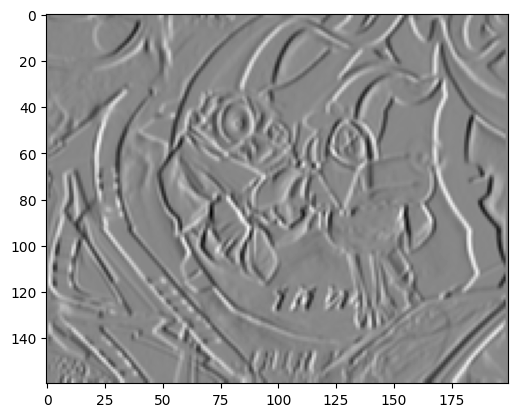

In [ ]:
graffiti_uint8 = (graffiti * 255).astype(np.uint8)

# Define the filter
filter = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])

# Apply the filter
convolved_image = cv2.filter2D(graffiti, -1, filter)

# Visualize the result
plt.imshow(convolved_image, cmap='gray')

# 2. Harris corner detector

We will now implement the Harris corner detector, and apply it to the graffiti image.

## Image gradients

I first need to compute the image gradients, without use the ```Sobel``` function.

In [ ]:
# Define the filters
filter_x = np.array([[1, 0, -1],
                     [2, 0, -2],
                     [1, 0, -1]])
filter_y = np.array([[1, 2, 1],
                     [0, 0, 0],
                     [-1, -2, -1]])
# Apply the filters using cv2.filter2D
Ix = cv2.filter2D(graffiti, -1, filter_x)
Iy = cv2.filter2D(graffiti, -1, filter_y)

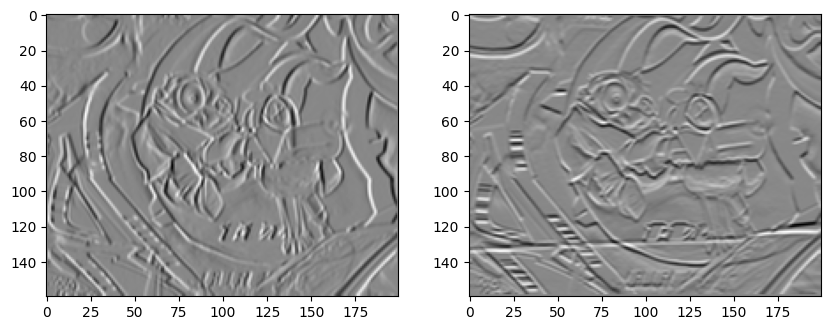

In [ ]:
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1)
plt.imshow(Ix, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(Iy, cmap='gray')
plt.show()

I compute the images $I_x^2$, $I_y^2$, and $I_x I_y$.

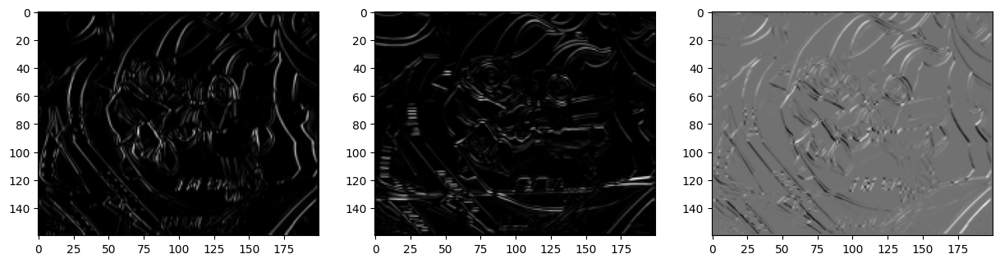

In [ ]:
# Square the gradients
I2x = np.square(Ix)
I2y = np.square(Iy)

# Compute the product of the gradients
IxIy = np.multiply(Ix, Iy)

# Visualize the results
fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1, 3, 1)
plt.imshow(I2x, cmap='gray')

fig.add_subplot(1, 3, 2)
plt.imshow(I2y, cmap='gray')

fig.add_subplot(1, 3, 3)
plt.imshow(IxIy, cmap='gray')

plt.show()

I apply Gaussian blur of standard deviation 1.0 to $I_x^2$, $I_y^2$, $I_x I_y$.

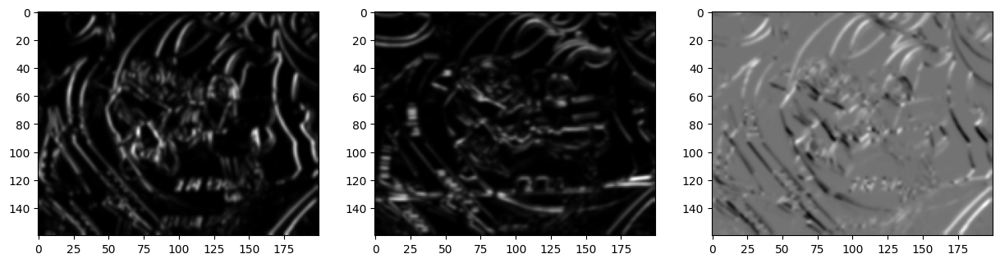

In [ ]:
sigma = 1.0
kernel_size = (7, 7)

I2x_blurred = cv2.GaussianBlur(I2x, kernel_size, sigma)
I2y_blurred = cv2.GaussianBlur(I2y, kernel_size, sigma)
IxIy_blurred = cv2.GaussianBlur(IxIy, kernel_size, sigma)

# Visualize the blurred images
fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1, 3, 1)
plt.imshow(I2x_blurred, cmap='gray')

fig.add_subplot(1, 3, 2)
plt.imshow(I2y_blurred, cmap='gray')

fig.add_subplot(1, 3, 3)
plt.imshow(IxIy_blurred, cmap='gray')

plt.show()

I compute the Harris score map, using the formula $\text{det}\;Q - 0.04 \; (\text{tr}^\;Q)^{2}$.  This formula is often used to approximate the smallest eigenvalue or the ratio of the determinant and the trace, as it is faster to compute.

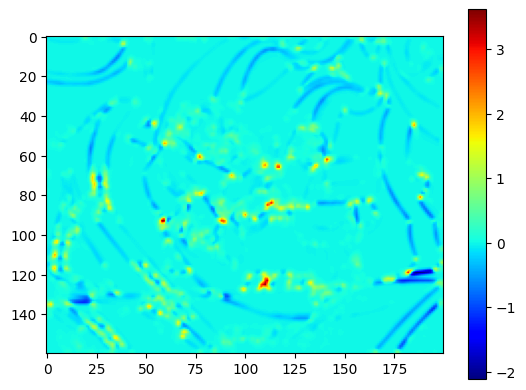

In [ ]:
# Compute the determinant of Q
detQ = (I2x_blurred * I2y_blurred) - (IxIy_blurred ** 2)

# Compute the trace of Q
trQ = I2x_blurred + I2y_blurred

# Compute the Harris score map
score = detQ - 0.04 * (trQ ** 2)

# Visualize the Harris score map
plt.imshow(score, cmap='jet')
plt.colorbar()
plt.show()

I find the local maxima of the score map to create a list of interest points.

In [ ]:
from scipy.ndimage import maximum_filter

size = 3  # Size of the neighborhood to consider
local_max = maximum_filter(score, size=size) == score

threshold = 0.5
detected_points = (score > threshold) & local_max

# Get coordinates of points
y, x = np.nonzero(detected_points)
points = np.array([x, y]).T  # List of points, each point is [x, y]

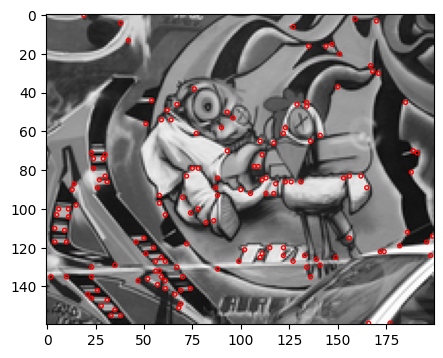

In [ ]:
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(graffiti,cmap='gray')

for p in points:
  pt = patches.Circle((p[0], p[1]), radius = 1, edgecolor = 'r', fill = False)
  ax.add_patch(pt)

plt.show()


## ```detect_harris_points``` Function

I create a function ```detect_harris_points```.  The function takes as input a grayscale image, the standard deviation of the Gaussian filter that is applied to the products of image derivatives, and the threshold applied to the Harris score to keep a point or not.

The function returns a list of points. Each point is stored as an array of 3 values: its x and y coordinates and its Harris score.

In [ ]:
def detect_harris_points(image, sigma=1.0, threshold=0.5):
    # Compute gradients
    filter_x = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
    filter_y = np.array([[1, 2, 1],
                         [0, 0, 0],
                         [-1, -2, -1]])

    Ix = cv2.filter2D(image, cv2.CV_32F, filter_x)
    Iy = cv2.filter2D(image, cv2.CV_32F, filter_y)

    # Compute products of gradients
    I2x = Ix**2
    I2y = Iy**2
    IxIy = Ix*Iy

    # Apply Gaussian blur
    I2x_blurred = cv2.GaussianBlur(I2x, (11, 11), sigma)
    I2y_blurred = cv2.GaussianBlur(I2y, (11, 11), sigma)
    IxIy_blurred = cv2.GaussianBlur(IxIy, (11, 11), sigma)

    # Compute Harris score
    detQ = (I2x_blurred * I2y_blurred) - (IxIy_blurred ** 2)
    trQ = I2x_blurred + I2y_blurred
    score = detQ - 0.04 * (trQ)

    # Scale scores between 0 and 1
    min_score = np.min(score)
    max_score = np.max(score)
    score_scaled = (score - min_score) / (max_score - min_score)

    size = 5  # Size of the neighborhood to consider
    local_max = maximum_filter(score_scaled, size) == score_scaled

    interest_points = np.argwhere(local_max & (score_scaled > threshold))

    points = [[point[1], point[0], score_scaled[point[0], point[1]]] for point in interest_points]

    return points

# 3. Keypoint matching

In [ ]:
import cv2 # OpenCV
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# To see the images in a notebook:
%matplotlib inline

In [ ]:
!wget "http://imagine.enpc.fr/~lepetitv/triva/asterix1.png"
!wget "http://imagine.enpc.fr/~lepetitv/triva/asterix2.png"
!ls

# With or without Colab, then:
img = plt.imread('asterix1.png')
I1 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = plt.imread('asterix2.png')
I2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

--2024-03-26 09:41:30--  http://imagine.enpc.fr/~lepetitv/triva/asterix1.png
Resolving imagine.enpc.fr (imagine.enpc.fr)... 195.221.193.65
Connecting to imagine.enpc.fr (imagine.enpc.fr)|195.221.193.65|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106551 (104K) [image/png]
Saving to: ‘asterix1.png.1’

asterix1.png.1      100%[===================>] 104.05K   433KB/s    in 0.2s    

2024-03-26 09:41:31 (433 KB/s) - ‘asterix1.png.1’ saved [106551/106551]

--2024-03-26 09:41:31--  http://imagine.enpc.fr/~lepetitv/triva/asterix2.png
Resolving imagine.enpc.fr (imagine.enpc.fr)... 195.221.193.65
Connecting to imagine.enpc.fr (imagine.enpc.fr)|195.221.193.65|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106278 (104K) [image/png]
Saving to: ‘asterix2.png.1’

asterix2.png.1      100%[===================>] 103.79K   432KB/s    in 0.2s    

2024-03-26 09:41:31 (432 KB/s) - ‘asterix2.png.1’ saved [106278/106278]

asterix1.png	asterix2.png.1	    

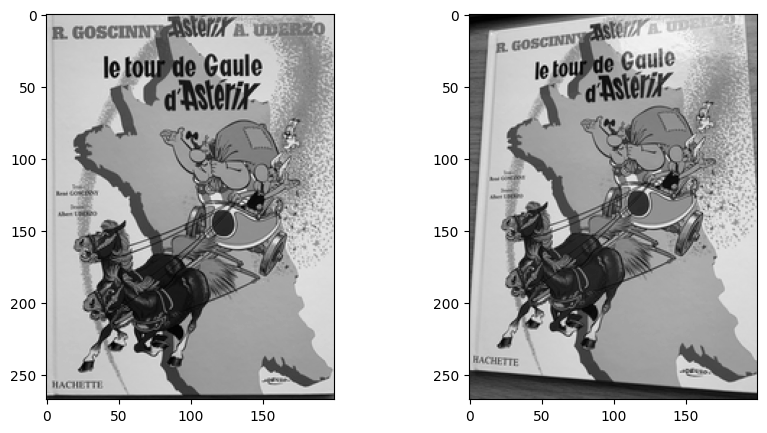

In [ ]:
# Not necessary, but let you control the size of the image:
figsize = 5
fig = plt.figure(figsize=(2*figsize,figsize))
# Actually show the image
fig.add_subplot(1, 2, 1)
plt.imshow(I1, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(I2, cmap='gray')
plt.show()

In [ ]:
P1 = detect_harris_points(I1, 1.0, 0.1)
P2 = detect_harris_points(I2, 1.0, 0.1)

I use th code below to visualize the results.

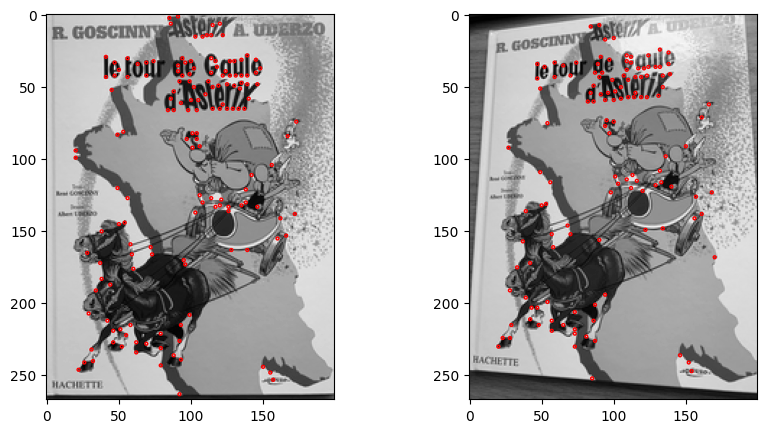

In [ ]:
def show_img_and_points(ax, image, points):
  ax.imshow(image, cmap='gray')
  for p in points:
    pt = patches.Circle((p[0], p[1]), radius = 1, edgecolor = 'r', fill = False)
    ax.add_patch(pt)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 5))
show_img_and_points(ax1, I1, P1)
show_img_and_points(ax2, I2, P2)
plt.show()


## ```extract_descriptors``` Function

I wrote a function called ```extract_descriptors```. This function should take as input an image, and a list of points as returned by the ```detect_harris_points``` function. This function returns a list of descriptors. Each descriptor is coded as a numpy array.

I use very simple descriptors: The descriptor of a Harris point will be made of the 7x7 intensity values around this point.


In [ ]:
def extract_descriptors(image, points):
  descriptors = []
  size = 3
  image = np.pad(image, ((size, size), (size, size)), mode='constant')

  for point in points:
    x, y, _ = point
    descriptor = image[y:y + 2 * size + 1, x:x + 2 * size + 1]
    descriptors.append(descriptor)

  return descriptors

Calling the ```extract_descriptors``` for the 2 images:

In [ ]:
D1 = extract_descriptors(I1, P1)
D2 = extract_descriptors(I2, P2)

## 4. ```match_V1``` Function

I wrote a first function ```match_V1``` for matching two sets of points based on their descriptors. This function takes as input a first list of points, the list of their descriptors, a second list of points, and the list of their descriptors. It returns a list of matches, each match represented as an array of the indices of two matching points.

A point $p_1$ in the first image matched with the point $p_2$ in the second image with the smallest distance in the descriptor space. In other words, $p1$  matched with
$$
\arg \min_{p_2 \in P_2} \|desc(p_1) - desc(p_2)\| \> ,
$$
where $P_2$ is the set of points detected in the second image, and $desc(p)$ is the descriptor of point $p$.


In [ ]:
# This version actually does not use points1 and points2 but the next version will:

def match_V1(points1, descriptors1, points2, descriptors2):
    matches = list()

    for i, desc1 in enumerate(descriptors1):
        min_distance = np.inf
        match_index = None
        for j, desc2 in enumerate(descriptors2):
            distance = np.linalg.norm(desc1 - desc2)
            if distance < min_distance:
                min_distance = distance
                match_index = j
        matches.append([i, match_index])

    return matches

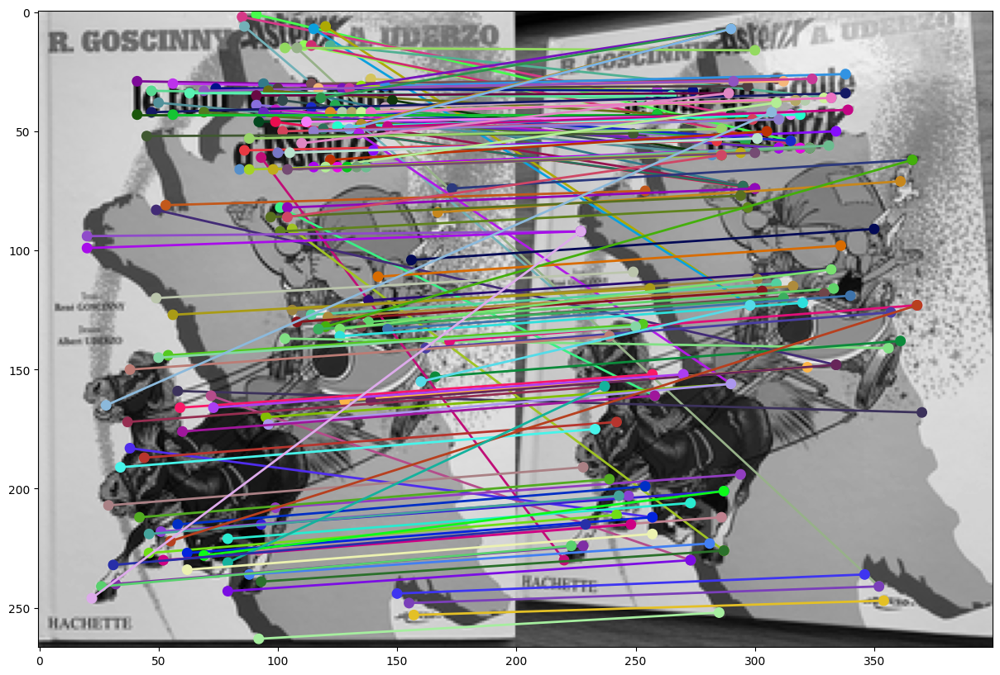

In [ ]:
def show_matches(image1, image2, matches, points1, points2):
  pair = np.hstack((image1, image2))
  fig, ax = plt.subplots(figsize=(20, 10))
  ax.imshow(pair, cmap='gray')
  for m in matches:
    p1 = points1[m[0]][0:2]
    p2 = points2[m[1]][0:2]
    p2[0] = p2[0] + image1.shape[1]
    line = np.array([p1, p2])
    rc = np.random.uniform(0.0, 1.0, 3)
    pt = patches.Polygon(line, color = rc, lw = 2.0)
    ax.add_patch(pt)
    pt = patches.Circle(p1, radius = 2, color = rc, fill = True)
    ax.add_patch(pt)
    pt = patches.Circle(p2, radius = 2, color = rc, fill = True)
    ax.add_patch(pt)
  plt.show()

M = match_V1(P1, D1, P2, D2)
show_matches(I1, I2, M, P1, P2)

## 5. ```match_V2``` function

I wrote an improved version of the ```match``` function. This function looks for the correspondent of $p_1$ only in a region centered on $p_1$. I used a region of size 40x40.

In [ ]:
def match_V2(points1, descriptors1, points2, descriptors2, region_size=40):
    matches = []
    half_size = region_size // 2  # Half size of the region to consider around the point

    for i, (point1, desc1) in enumerate(zip(points1, descriptors1)):
        x1, y1 = point1[:2]  # Assuming points are stored as [x, y, score]
        min_distance = np.inf
        match_index = None
        for j, (point2, desc2) in enumerate(zip(points2, descriptors2)):
            x2, y2 = point2[:2]
            # Check if point2 is within the 40x40 region centered at point1
            if x1 - half_size <= x2 <= x1 + half_size and y1 - half_size <= y2 <= y1 + half_size:
                distance = np.linalg.norm(desc1 - desc2)
                if distance < min_distance:
                    min_distance = distance
                    match_index = j
        matches.append(np.array([i, match_index]))

    return matches

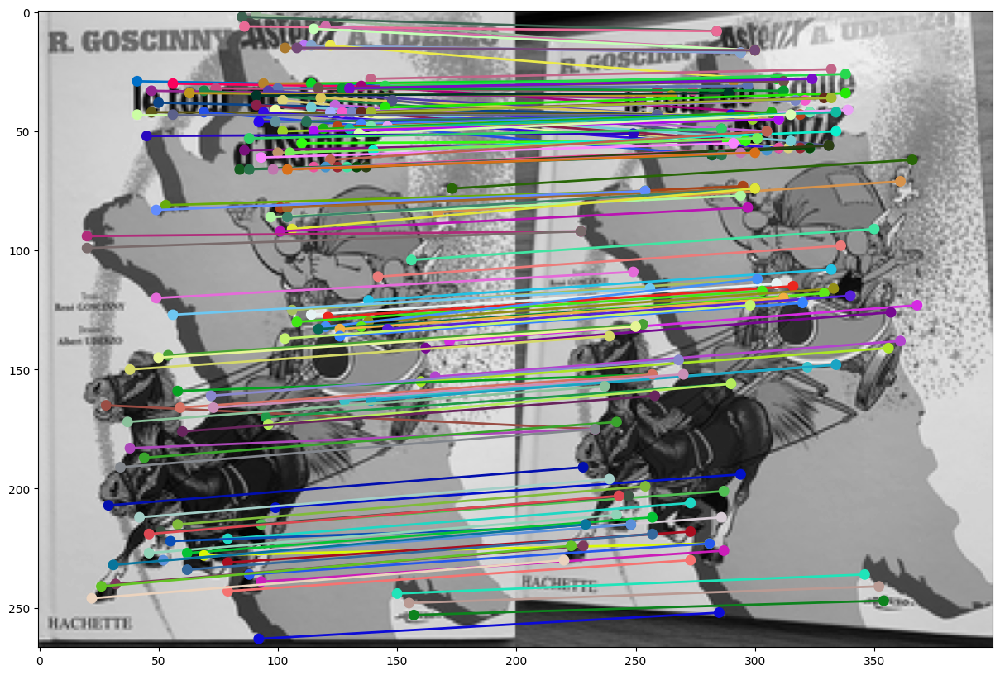

In [ ]:
M = match_V2(P1, D1, P2, D2)
show_matches(I1, I2, M, P1, P2)

## 6. ```match_V3``` function

I wrote an even improved version of the ```match``` function. This function  keeps matches only if the 2 points "chose" each other.

With this version, I get only 2 incorrect matches.

In [ ]:
def match_V3(points1, descriptors1, points2, descriptors2, region_size=40):
    half_size = region_size // 2
    matches = []

    # Forward matching from points1 to points2
    forward_matches = {}
    for i, (point1, desc1) in enumerate(zip(points1, descriptors1)):
        x1, y1 = point1[:2]
        min_distance = np.inf
        match_index = None
        for j, (point2, desc2) in enumerate(zip(points2, descriptors2)):
            x2, y2 = point2[:2]
            if x1 - half_size <= x2 <= x1 + half_size and y1 - half_size <= y2 <= y1 + half_size:
                distance = np.linalg.norm(desc1 - desc2)
                if distance < min_distance:
                    min_distance = distance
                    match_index = j
        if match_index is not None:
            forward_matches[i] = match_index

    # Reverse matching from points2 to points1
    reverse_matches = {}
    for j, (point2, desc2) in enumerate(zip(points2, descriptors2)):
        x2, y2 = point2[:2]
        min_distance = np.inf
        match_index = None
        for i, (point1, desc1) in enumerate(zip(points1, descriptors1)):
            x1, y1 = point1[:2]
            if x2 - half_size <= x1 <= x2 + half_size and y2 - half_size <= y1 <= y2 + half_size:
                distance = np.linalg.norm(desc2 - desc1)
                if distance < min_distance:
                    min_distance = distance
                    match_index = i
        if match_index is not None:
            reverse_matches[j] = match_index

    # Keep only mutual matches
    for i, j in forward_matches.items():
        if reverse_matches.get(j) == i:
            matches.append(np.array([i, j]))

    return matches

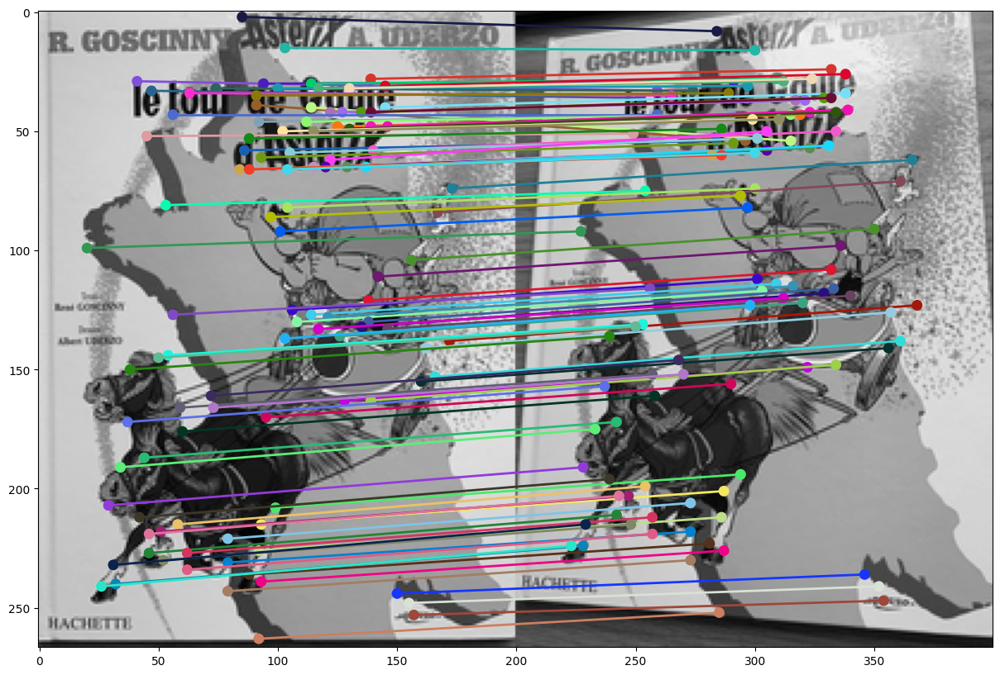

In [ ]:
M = match_V3(P1, D1, P2, D2)
show_matches(I1, I2, M, P1, P2)

## 7. Match rectangles

I load these new images:

In [ ]:
import os

for i in range(8):
  url = "http://imagine.enpc.fr/~lepetitv/triva/vangogh%d.png" % i
  os.system('wget %s' % url)

In [ ]:
vangogh = []
for i in range(8):
  filename = "vangogh%d.png" % i
  img = plt.imread(filename)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  vangogh.append(img)

I visualize these images by calling the function below.

In [ ]:
def show_vangogh(rectangles = None):
  GT = [
      [[100,210], [394,424]],
      [[ 40,182], [327,391]],
      [[ 53, 95], [326,290]],
      [[ 74,163], [352,367]],
      [[ 81,121], [364,325]],
      [[ 99,107], [360,288]],
      [[132,346], [401,546]],
      [[123,329], [426,551]]
  ]
  fig, axes = plt.subplots(2,4, figsize=(20, 10))
  if rectangles != None:
    print("%d pose(s) provided" % len(rectangles))
  n = 0
  for i in range(2):
    for j in range(4):
      axes[i][j].imshow(vangogh[n], cmap='gray')
      if n < len(GT):
        pt = patches.Rectangle(GT[n][0], GT[n][1][0] - GT[n][0][0], GT[n][1][1] - GT[n][0][1], fill = False, ec = 'red')
        axes[i][j].add_patch(pt)
      if rectangles != None and n > 0 and n-1 < len(rectangles):
        pt = patches.Rectangle(rectangles[n-1][0], rectangles[n-1][1][0] - rectangles[n-1][0][0], rectangles[n-1][1][1] - rectangles[n-1][0][1], fill = False, ec = 'blue')
        axes[i][j].add_patch(pt)
        error = np.linalg.norm(np.array(rectangles[n-1][0]) - np.array(GT[n][0]))
        error += np.linalg.norm(np.array(rectangles[n-1][1]) - np.array(GT[n][1]))
        print("Error for image %d: %f" % (n, error))
      n = n + 1
  plt.show()

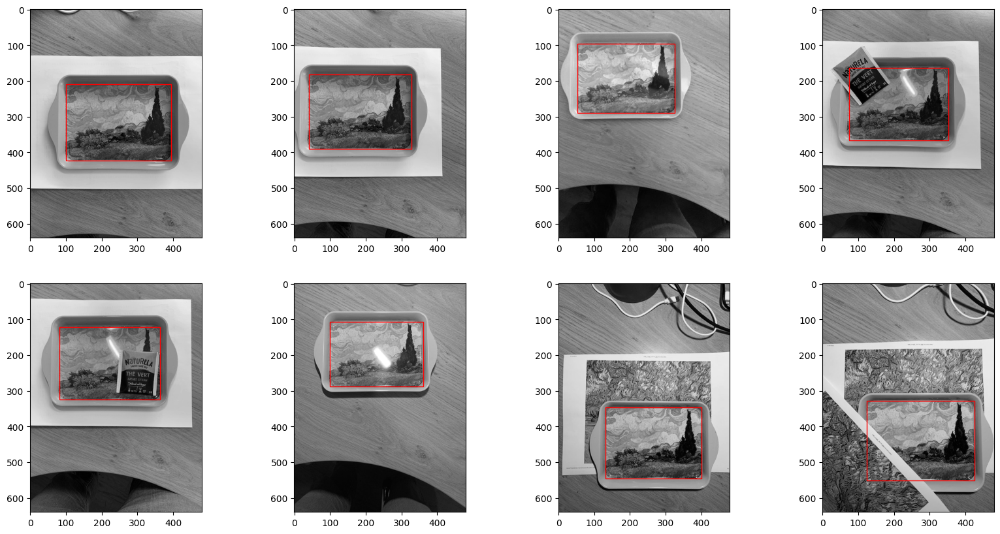

In [ ]:
show_vangogh()

We want to retrieve the reproduction of the painting in all the images.

Let's assume we know the reproduction is in the rectangle [[100,210], [394,424]] (the x,y coordinates of the top-left corner, followed by the x,y coordinates of the bottom-right corner) in the first image. I used ```match_V3``` function to find matches between the first and second images.

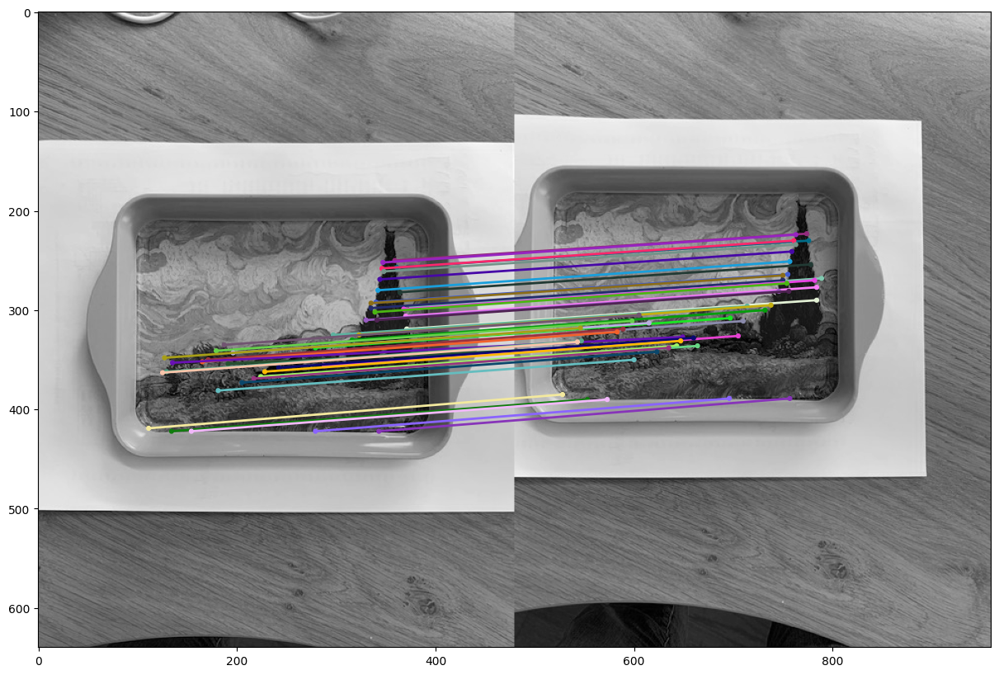

In [ ]:
# Detect keypoints and extract descriptors for the first two images
points1 = detect_harris_points(vangogh[0], threshold=0.15)
descriptors1 =  extract_descriptors(vangogh[0], points1)
points2 = detect_harris_points(vangogh[1], threshold=0.15)
descriptors2 = extract_descriptors(vangogh[1], points2)

# Match keypoints between the two images
matches = match_V3(points1, descriptors1, points2, descriptors2, region_size=200)

# Filter matches within the known rectangle in the first image
known_rectangle = [[100, 210], [394, 424]]
filtered_matches = [m for m in matches if known_rectangle[0][0] <= points1[m[0]][0] <= known_rectangle[1][0] and known_rectangle[0][1] <= points1[m[0]][1] <= known_rectangle[1][1]]

show_matches(vangogh[0], vangogh[1], filtered_matches, points1, points2)

To find the rectangle's position in the second image, given its position in the first image and knowing some points that match between these two images, I followed these steps:

1. **Detect Points and Extract Descriptors:** First, I detected keypoints (interesting points) in both images and extracted descriptors for these points. Descriptors help in understanding how a small patch around a point looks, so we can find matching points in the two images.

2. **Filter Matches within the Rectangle:** I used the matches between the two images, but only kept those that fall within the known rectangle in the first image. This way, I focused on points that are likely part of the same object (the painting) we're interested in both images.

3. **Calculate Shifts for Filtered Matches:** For each of the filtered matches, I calculated how much each matching point moved from the first image to the second. This shift tells us how the object's position changed.

4. **Average the Shifts:** I averaged all these shifts to get a single "average shift," assuming the object moved similarly across all these points. This helps to account for small errors in individual matches.

5. **Apply the Average Shift to the Rectangle:** I took the rectangle's position in the first image and moved it by the average shift. This gives us an estimated position of the rectangle in the second image, assuming the painting moved as a whole.

1 pose(s) provided
Error for image 1: 8.652717


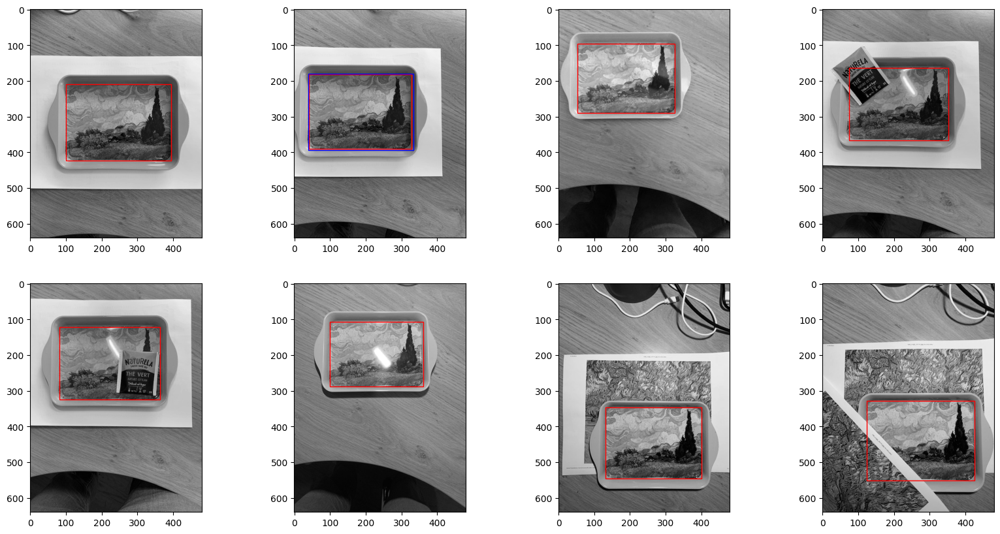

In [ ]:
# Calculate shifts for filtered matches
shifts = []
for match in filtered_matches:
    # Extract matched points
    p1 = np.array(points1[match[0]][:2])
    p2 = np.array(points2[match[1]][:2])

    # Calculate shift
    shift = p2 - p1
    shifts.append(shift)

# Convert list of shifts to a numpy array for easy calculations
shifts = np.array(shifts)

# Compute average shift
average_shift = np.mean(shifts, axis=0)

# Apply the average shift to the known rectangle's corners to estimate its position in the second image
known_rect_top_left = np.array(known_rectangle[0])
known_rect_bottom_right = np.array(known_rectangle[1])

# Apply shift
estimated_top_left = known_rect_top_left + average_shift
estimated_bottom_right = known_rect_bottom_right + average_shift

# The estimated rectangle in the second image
estimated_rectangle = [estimated_top_left.tolist(), estimated_bottom_right.tolist()]

# Visualize the result
show_vangogh([estimated_rectangle])

7 pose(s) provided
Error for image 1: 10.270872
Error for image 2: 28.352484
Error for image 3: 19.861182
Error for image 4: 185.418437
Error for image 5: 46.676338
Error for image 6: 31.210147
Error for image 7: 14.375509


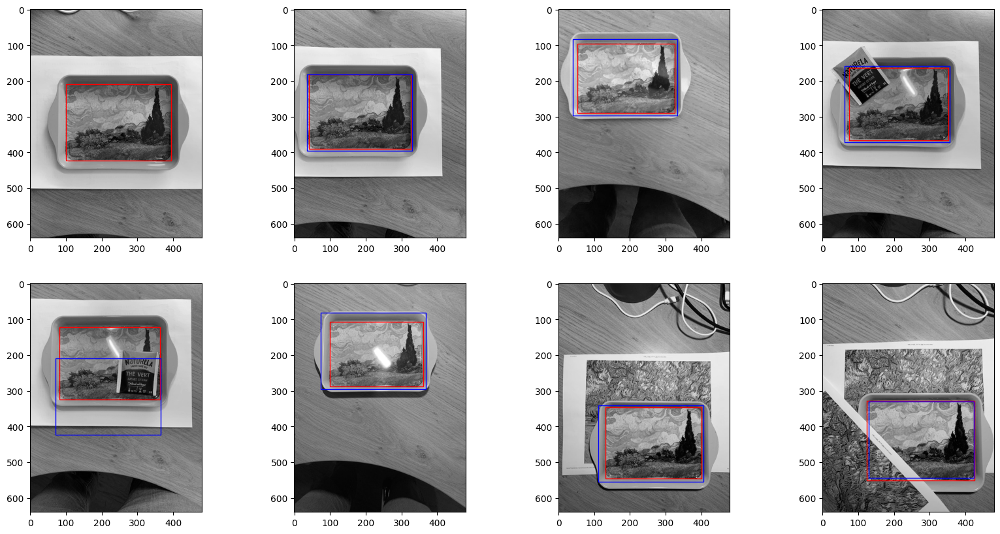

In [ ]:
# Initialize the known rectangle from the first image
known_rectangle = [[100, 210], [394, 424]]
estimated_rectangles = []  # To store the estimated positions for all images

# Reference points and descriptors from the first image
points_ref = detect_harris_points(vangogh[0], threshold=0.3)
descriptors_ref = extract_descriptors(vangogh[0], points_ref)

for i in range(1, len(vangogh)):
    # Detect keypoints and extract descriptors for the ith image
    points_i = detect_harris_points(vangogh[i], threshold=0.3)
    descriptors_i = extract_descriptors(vangogh[i], points_i)

    # Match keypoints with the first image
    matches = match_V3(points_ref, descriptors_ref, points_i, descriptors_i, region_size=400)

    # Calculate shifts for filtered matches
    shifts = [np.array(points_i[m[1]][:2]) - np.array(points_ref[m[0]][:2])
          for m in matches
          if known_rectangle[0][0] <= points_ref[m[0]][0] <= known_rectangle[1][0] and
             known_rectangle[0][1] <= points_ref[m[0]][1] <= known_rectangle[1][1]]

    # Continue only if there are matches
    if shifts:
        shifts = np.array(shifts)
        average_shift = np.mean(shifts, axis=0)

        # Apply the average shift to the known rectangle's corners to estimate its position in the ith image
        estimated_top_left = np.array(known_rectangle[0]) + average_shift
        estimated_bottom_right = np.array(known_rectangle[1]) + average_shift

        # Store the estimated rectangle
        estimated_rectangle = [estimated_top_left.tolist(), estimated_bottom_right.tolist()]
        estimated_rectangles.append(estimated_rectangle)
    else:
        # If no matches are found, append a placeholder or handle as needed
        estimated_rectangles.append(None)

# Visualize the result for all images, adjusting the function call as needed
show_vangogh(estimated_rectangles)

After applying the method to estimate the positions of the reproduction across all 8 images, the results are generally good, accurately approximating the reproduction's location in most cases. The method successfully captures the shifts and changes in the reproduction's size from one image to the next, demonstrating the effectiveness of using outermost matched points to define the new rectangles. This approach allows for an adaptive estimation that can accommodate variations in scale and position, reflecting the dynamic nature of the visual content across the series of images.

However, an exception is observed in image number 5. In this particular case, the result is not as accurate as in the other images. The reason for this discrepancy can be attributed to a large tree that partially obscures the view of the reproduction. This tree, being a prominent feature in the image, attracts a significant number of keypoints, leading to a concentration of points of interest in its area. As a result, the estimated rectangle for the reproduction is influenced by the location of these points, causing a deviation from the actual position and size of the reproduction. This highlights a limitation of the method when faced with significant occlusions or distractions that can draw keypoints away from the main subject of interest, in this case, the reproduction.

Let's try with an other threshold :

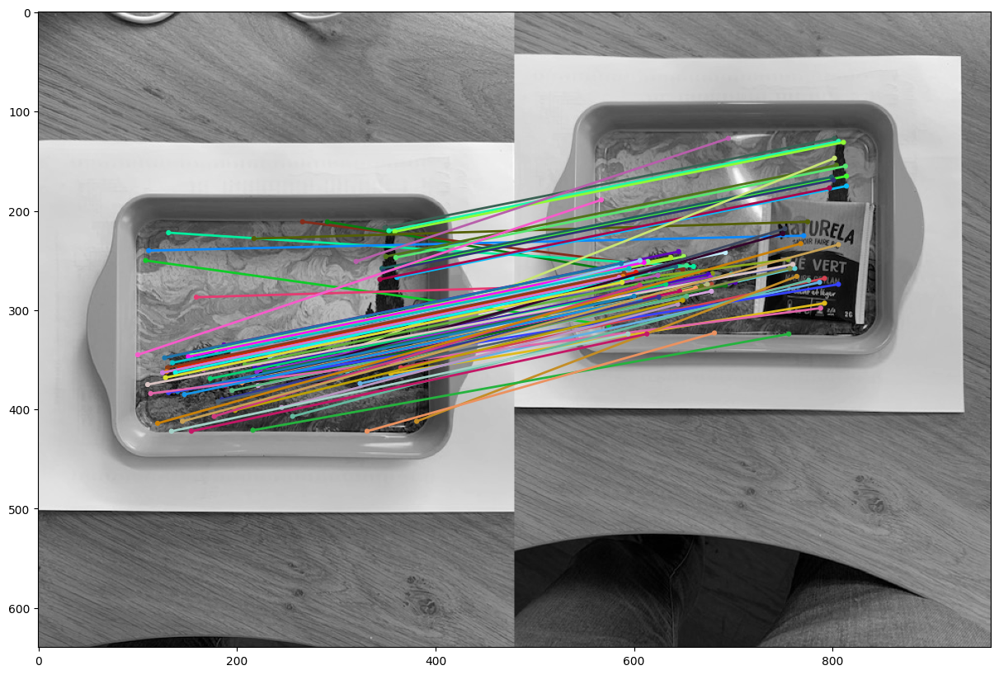

In [ ]:
# Detect keypoints and extract descriptors for the first two images
points1 = detect_harris_points(vangogh[0], threshold=0.09)
descriptors1 =  extract_descriptors(vangogh[0], points1)
points5 = detect_harris_points(vangogh[4], threshold=0.09)
descriptors5 = extract_descriptors(vangogh[4], points5)

# Match keypoints between the two images
matches = match_V3(points1, descriptors1, points5, descriptors5, region_size=400)

# Filter matches within the known rectangle in the first image
known_rectangle = [[100, 210], [394, 424]]
filtered_matches = [m for m in matches if known_rectangle[0][0] <= points1[m[0]][0] <= known_rectangle[1][0] and known_rectangle[0][1] <= points1[m[0]][1] <= known_rectangle[1][1]]

show_matches(vangogh[0], vangogh[4], filtered_matches, points1, points5)

7 pose(s) provided
Error for image 1: 0.000000
Error for image 2: 0.000000
Error for image 3: 0.000000
Error for image 4: 20.052150
Error for image 5: 0.000000
Error for image 6: 0.000000
Error for image 7: 0.000000


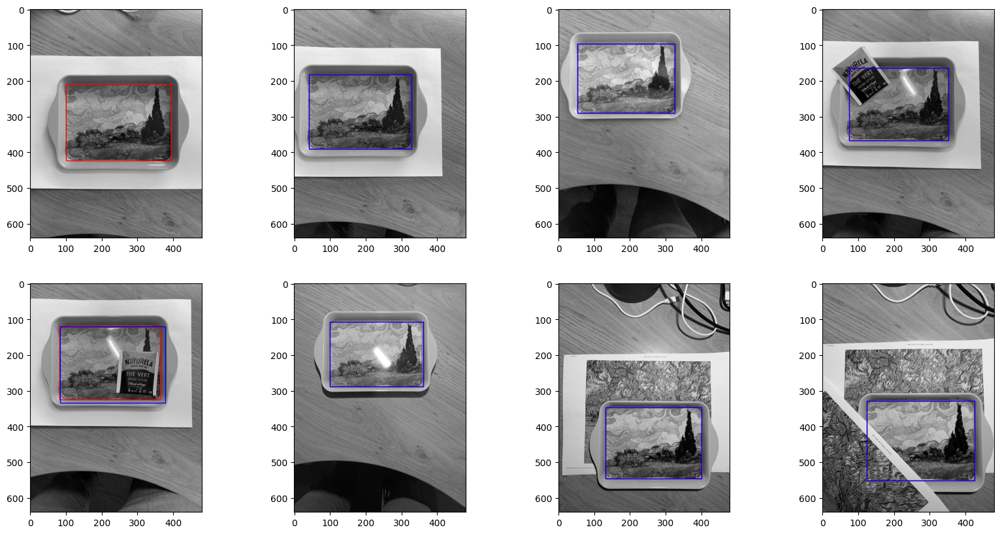

In [ ]:
# Calculate shifts for filtered matches
shifts = []
for match in filtered_matches:
    # Extract matched points
    p1 = np.array(points1[match[0]][:2])
    p2 = np.array(points5[match[1]][:2])

    # Calculate shift
    shift = p2 - p1
    shifts.append(shift)

# Convert list of shifts to a numpy array for easy calculations
shifts = np.array(shifts)

# Compute average shift
average_shift = np.mean(shifts, axis=0)

# Apply the average shift to the known rectangle's corners to estimate its position in the second image
known_rect_top_left = np.array(known_rectangle[0])
known_rect_bottom_right = np.array(known_rectangle[1])

# Apply shift
estimated_top_left = known_rect_top_left + average_shift
estimated_bottom_right = known_rect_bottom_right + average_shift

# The estimated rectangle in the second image
estimated_rectangle = [estimated_top_left.tolist(), estimated_bottom_right.tolist()]

# Visualize the result
show_vangogh( [
      [[ 40,182], [327,391]],
      [[ 53, 95], [326,290]],
      [[ 74,163], [352,367]],
      estimated_rectangle,
      [[ 99,107], [360,288]],
      [[132,346], [401,546]],
      [[123,329], [426,551]]
  ])

It has been observed that setting a threshold of 0.3 yields good results for 7 out of the total images processed. However, for image 5 specifically, a much lower threshold of 0.09 was required to achieve satisfactory outcomes. This variation in optimal threshold values across different images suggests that a fixed threshold approach might not be universally effective. Therefore, it might be beneficial to consider a more general method that does not rely on a predefined threshold. One possible approach could be to retain a certain percentage of the top interest points from the list, based on their calculated scores.

To further improve our model, incorporating a mechanism to dynamically scale the rectangle based on the observed changes in size across images could significantly enhance our ability to adapt the estimated rectangle's size to each image more precisely. This would provide a more robust method capable of dealing with variations not only in position but also in scale, offering a comprehensive solution to accurately track the reproduction across all images.